In [31]:
from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.applications.resnet50 import ResNet50
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

In [32]:
# re-size all the images to this
IMAGE_SIZE = [224, 224]


train_path = 'D:/GenderDetection/dataset/Train/'
valid_path = 'D:/GenderDetection/dataset/Test/'

# add preprocessing layer to the front of VGG
mbnt = MobileNetV2(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)
#mbnt =ResNet50(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [33]:

import os
imageCount=0
row=1
for path, currentDirectory, files in os.walk("D:/GenderDetection/dataset/Test/"):
    for file in files:
        print(os.path.join(path, file))
        imageCount=imageCount + 1

      

D:/GenderDetection/dataset/Test/female\169.png
D:/GenderDetection/dataset/Test/female\170.png
D:/GenderDetection/dataset/Test/female\171.png
D:/GenderDetection/dataset/Test/female\172.png
D:/GenderDetection/dataset/Test/female\173.png
D:/GenderDetection/dataset/Test/female\174.png
D:/GenderDetection/dataset/Test/female\175.png
D:/GenderDetection/dataset/Test/female\176.png
D:/GenderDetection/dataset/Test/female\178.png
D:/GenderDetection/dataset/Test/female\179.png
D:/GenderDetection/dataset/Test/female\180.png
D:/GenderDetection/dataset/Test/female\181.png
D:/GenderDetection/dataset/Test/female\182.png
D:/GenderDetection/dataset/Test/female\183.png
D:/GenderDetection/dataset/Test/female\184.png
D:/GenderDetection/dataset/Test/female\185.png
D:/GenderDetection/dataset/Test/female\187.png
D:/GenderDetection/dataset/Test/female\188.png
D:/GenderDetection/dataset/Test/female\189.png
D:/GenderDetection/dataset/Test/female\190.png
D:/GenderDetection/dataset/Test/female\191.png
D:/GenderDete

In [34]:
imageCount

217

In [35]:
# don't train existing weights
for layer in mbnt.layers:
    layer.trainable = False

In [36]:
  # useful for getting number of classes

folders = glob('D:/GenderDetection/dataset/Train/*')
print(len(folders))

2


In [37]:
# our layers - you can add more if you want
x = Flatten()(mbnt.output)
x = Dense(50, activation='relu')(x)
x = Dense(50, activation='relu')(x)
prediction = Dense(len(folders), activation='softmax')(x)
#prediction = Dense(1, activation='sigmoid')(x)


In [38]:
# create a model object
model = Model(inputs=mbnt.input, outputs=prediction)

In [39]:
# view the structure of the model
model.summary()


Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
_______________________________________________________________________________________

In [40]:
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [41]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)
      

training_set = train_datagen.flow_from_directory('D:/GenderDetection/dataset/Train/',
                                                 target_size = (224, 224),
                                                 batch_size = 16,
                                                 class_mode = 'categorical')

test_set = test_datagen.flow_from_directory('D:/GenderDetection/dataset/Test/',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 300 images belonging to 2 classes.
Found 217 images belonging to 2 classes.


In [42]:
import os
cats=[]
cat=[]

for path, currentDirectory, files in os.walk("D:/GenderDetection/dataset/Train/"):
    for file in files:
        #print(os.path.join(path, file))
        #print(file)
        cats=path.split("\\")
        cats=cats[len(cats)-1]
        if cats not in cat:
            cat.append(cats)
            print(cats)
cat.sort()
print(cat)

#images,cls = next(test_set)



D:/GenderDetection/dataset/Train/female
D:/GenderDetection/dataset/Train/male
['D:/GenderDetection/dataset/Train/female', 'D:/GenderDetection/dataset/Train/male']


In [43]:
#images,cls = next(test_set)
#plt.imshow(images[3])
#plt.savefig('D:\\imageeee.png')
#print("ok")
#plt.show()

In [44]:
print(len(test_set))
print(len(training_set))

14
19


In [48]:
# fit the model
r = model.fit(
  training_set,
  validation_data=test_set,
  epochs=7,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/7
19/19 [==============================] - 22s 1s/step - loss: 0.0309 - accuracy: 0.9900 - val_loss: 0.6792 - val_accuracy: 0.8986
Epoch 2/7
19/19 [==============================] - 20s 1s/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.5903 - val_accuracy: 0.8986
Epoch 3/7
19/19 [==============================] - 21s 1s/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 0.5763 - val_accuracy: 0.9078
Epoch 4/7
19/19 [==============================] - 20s 1s/step - loss: 0.0081 - accuracy: 0.9967 - val_loss: 0.8189 - val_accuracy: 0.8802
Epoch 5/7
19/19 [==============================] - 19s 992ms/step - loss: 0.0559 - accuracy: 0.9867 - val_loss: 0.4829 - val_accuracy: 0.9263
Epoch 6/7
19/19 [==============================] - 19s 993ms/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 0.5268 - val_accuracy: 0.9171
Epoch 7/7
19/19 [==============================] - 19s 1s/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.5437 - val_accuracy: 0.9171


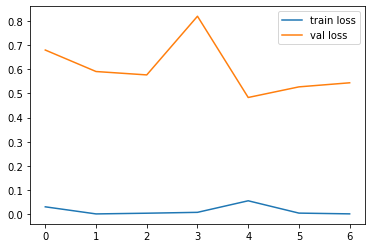

In [49]:
# loss
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()
#plt.savefig('LossVal_loss')

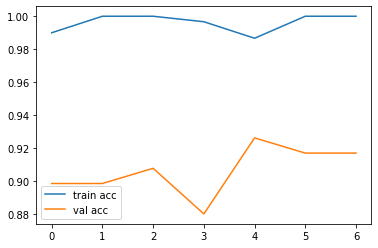

In [50]:
# accuracies
plt.plot(r.history['accuracy'], label='train acc')
plt.plot(r.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
#plt.savefig('AccVal_acc')

In [51]:
a, acc = model.evaluate(test_set)
print(acc)
print(a)

14/14 [==============================] - 7s 533ms/step - loss: 0.5437 - accuracy: 0.9171
0.9170507192611694
0.5437000393867493


In [52]:
#model.save("D:/CatractImagesMobileNet/cataract/Mobile114Model.h4")

In [53]:
test_set = test_datagen.flow_from_directory("D:/GenderDetection/dataset/Test/",
                                            target_size = (224, 224),
                                            batch_size = 40,
                                            class_mode = 'categorical')

pred = model.predict(test_set)
print(pred)

Found 217 images belonging to 2 classes.
[[6.16336704e-10 1.00000000e+00]
 [1.00000000e+00 1.37715324e-08]
 [9.99999881e-01 1.14789742e-07]
 [5.53361801e-08 1.00000000e+00]
 [5.52742004e-01 4.47257996e-01]
 [3.31538587e-07 9.99999642e-01]
 [1.00000000e+00 7.64390272e-16]
 [2.93685263e-03 9.97063100e-01]
 [1.00000000e+00 3.79969443e-08]
 [3.62654767e-10 1.00000000e+00]
 [4.39266614e-08 1.00000000e+00]
 [6.36155801e-06 9.99993682e-01]
 [1.00000000e+00 1.67429626e-10]
 [4.14174364e-13 1.00000000e+00]
 [9.99770224e-01 2.29801008e-04]
 [3.21985692e-01 6.78014338e-01]
 [2.41763087e-06 9.99997616e-01]
 [3.97686517e-06 9.99996066e-01]
 [5.40420729e-11 1.00000000e+00]
 [9.90076363e-01 9.92359221e-03]
 [6.47747038e-06 9.99993563e-01]
 [1.00000000e+00 6.27459196e-10]
 [3.28477209e-14 1.00000000e+00]
 [7.54441426e-05 9.99924541e-01]
 [9.13708508e-01 8.62914324e-02]
 [6.91677791e-12 1.00000000e+00]
 [5.57643361e-03 9.94423568e-01]
 [9.99997616e-01 2.40396480e-06]
 [5.82659501e-04 9.99417305e-01]
 [

In [54]:
import xlsxwriter
workbook = xlsxwriter.Workbook('D:/GenderDetection/fireOutput/FireImagesAnalysis.xlsx')
worksheet1 = workbook.add_worksheet()
row=0
col=0
imageCount=0
worksheet1.write(row, 0, str("ImageName"))
worksheet1.write(row, 1, str("Actual Class Code"))
worksheet1.write(row, 2, str("Actual Class Name"))
worksheet1.write(row, 3, str("Predicted Result"))
worksheet1.write(row, 4, str("Class Code Based on Predicted Result"))
worksheet1.write(row, 5, str("Predicted Class Name"))
worksheet1.write(row, 6, str("CF-Measure"))

# importing the modules
import os
import shutil
# Providing the folder path
origin = 'D:\\GenderDetection\\dataset\\Test\\male\\'
target1 = 'D:\\GenderDetection\\TestCheck\\male\\'

# Fetching the list of all the files
files = os.listdir(origin)
actual=[]
predicted=[]
ac=[]
pr=[]
# Fetching all the files to directory
row=1
for file_name in files:
    shutil.copy(origin+file_name, target1+file_name)
    print("Original" + str(origin+file_name))
    test_datagen = ImageDataGenerator(rescale = 1./255)
    test_set = test_datagen.flow_from_directory('D:\\GenderDetection\\TestCheck\\',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')
    images,cls = next(test_set)
    filme=test_set.filenames
    #plt.imshow(images[0])
    worksheet1.write(row, 0, str(filme[0]))
    worksheet1.write(row, 1, str(cls[0]))
    worksheet1.write(row, 2, str("male"))
    print("Actual")
    print(cls[0])
    print(cls[0][0])
    print(cls[0][1])
    actual.append(cls[0])
    ac.append("male")
    print(filme[0])
    pred = model.predict(test_set)
    worksheet1.write(row, 3, str(pred))
    print("Predicted")
    print(pred)
    print(pred[0][0])
    print(pred[0][1])
    if(pred[0][0]>pred[0][1]):
        predicted.append([1.0,0.0])
        worksheet1.write(row, 4, str("[1.0,0.0]"))
        worksheet1.write(row, 5, str("female"))
        worksheet1.write(row, 6, str("False female"))
        pr.append("female")
        print("female")
    else:
        predicted.append([0.0,1.0])
        worksheet1.write(row, 4, str("[0.0,1.0]"))
        worksheet1.write(row, 5, str("male"))
        worksheet1.write(row, 6, str("True male"))
        pr.append("male")
        print("male")
    print("======================")
    path = r"D:\\GenderDetection\\TestCheck\\male\\"
    for fileN in os.listdir(path):
        # construct full file path
        fi = path + fileN
        if os.path.isfile(fi):
            print('Deleting file:', fi)
            os.remove(fi)
    row=row+1
print("Files are copied successfully")


OriginalD:\GenderDetection\dataset\Test\male\160.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\160.png
Predicted
[[5.4043103e-11 1.0000000e+00]]
5.4043103e-11
1.0
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\160.png
OriginalD:\GenderDetection\dataset\Test\male\164.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\164.png
Predicted
[[5.012570e-07 9.999995e-01]]
5.01257e-07
0.9999995
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\164.png
OriginalD:\GenderDetection\dataset\Test\male\165.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\165.png
Predicted
[[2.1501174e-04 9.9978501e-01]]
0.00021501174
0.999785
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\165.png
OriginalD:\GenderDetection\dataset\Test\male\192.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\192.png
Predicted
[[2.1927996e-04 9.9978071e-01]]
0.00021927996
0.9997807
male
Deleting file: D:\\GenderDetecti

Predicted
[[5.1250945e-06 9.9999487e-01]]
5.1250945e-06
0.9999949
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\222.png
OriginalD:\GenderDetection\dataset\Test\male\224.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\224.png
Predicted
[[0.00293681 0.9970632 ]]
0.0029368084
0.9970632
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\224.png
OriginalD:\GenderDetection\dataset\Test\male\225.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\225.png
Predicted
[[2.3729884e-04 9.9976271e-01]]
0.00023729884
0.9997627
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\225.png
OriginalD:\GenderDetection\dataset\Test\male\226.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\226.png
Predicted
[[1.6549879e-05 9.9998343e-01]]
1.6549879e-05
0.99998343
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\226.png
OriginalD:\GenderDetection\dataset\Test\male\227.png
Found 1 images belonging to 2 classes.
Ac

Predicted
[[2.5227996e-07 9.9999976e-01]]
2.5227996e-07
0.99999976
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\260.png
OriginalD:\GenderDetection\dataset\Test\male\261.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\261.png
Predicted
[[2.1328288e-13 1.0000000e+00]]
2.1328288e-13
1.0
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\261.png
OriginalD:\GenderDetection\dataset\Test\male\262.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\262.png
Predicted
[[1.8301088e-12 1.0000000e+00]]
1.8301088e-12
1.0
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\262.png
OriginalD:\GenderDetection\dataset\Test\male\263.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\263.png
Predicted
[[1.5953204e-07 9.9999988e-01]]
1.5953204e-07
0.9999999
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\263.png
OriginalD:\GenderDetection\dataset\Test\male\264.png
Found 1 images belonging to 2 classes.
Actual


Predicted
[[6.364847e-06 9.999937e-01]]
6.364847e-06
0.9999937
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\379.png
OriginalD:\GenderDetection\dataset\Test\male\380.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\380.png
Predicted
[[3.626506e-10 1.000000e+00]]
3.626506e-10
1.0
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\380.png
OriginalD:\GenderDetection\dataset\Test\male\381.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\381.png
Predicted
[[1.0632746e-06 9.9999893e-01]]
1.0632746e-06
0.9999989
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\381.png
OriginalD:\GenderDetection\dataset\Test\male\382.png
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
male\382.png
Predicted
[[2.2457178e-04 9.9977547e-01]]
0.00022457178
0.99977547
male
Deleting file: D:\\GenderDetection\\TestCheck\\male\\382.png
OriginalD:\GenderDetection\dataset\Test\male\383.png
Found 1 images belonging to 2 classes.
Actual


In [55]:
import os
import shutil
# Providing the folder path
origin = 'D:\\GenderDetection\\dataset\\Test\\female\\'
target1 = 'D:\\GenderDetection\\TestCheck\\female\\'

# Fetching the list of all the files
files = os.listdir(origin)

# Fetching all the files to directory
for file_name in files:
    shutil.copy(origin+file_name, target1+file_name)
    print("Original" + str(origin+file_name))
    test_datagen = ImageDataGenerator(rescale = 1./255)
    test_set = test_datagen.flow_from_directory('D:\\GenderDetection\\TestCheck\\',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')
    images,cls = next(test_set)
    filme=test_set.filenames
    
    #plt.imshow(images[0])
    worksheet1.write(row, 0, str(filme[0]))
    worksheet1.write(row, 1, str(cls[0]))
    worksheet1.write(row, 2, str("female"))
    print("Actual")
    print(cls[0])
    print(cls[0][0])
    print(cls[0][1])
    actual.append(cls[0])
    ac.append("female")
    print(filme[0])
    pred = model.predict(test_set)
    worksheet1.write(row, 3, str(pred))
    print("Predicted")
    print(pred)
    print(pred[0][0])
    print(pred[0][1])
    if(pred[0][0]>pred[0][1]):
        predicted.append([1.0,0.0])
        worksheet1.write(row, 4, str("[1.0,0.0]"))
        worksheet1.write(row, 5, str("female"))
        worksheet1.write(row, 6, str("True female"))
        pr.append("female")
    else:
        predicted.append([0.0,1.0])
        worksheet1.write(row, 4, str("[0.0,1.0]"))
        worksheet1.write(row, 5, str("male"))
        worksheet1.write(row, 6, str("False male"))
        pr.append("male")
    path = r"D:\\GenderDetection\\TestCheck\\female\\"
    for fileN in os.listdir(path):
        # construct full file path
        fi = path + fileN
        if os.path.isfile(fi):
            print('Deleting file:', fi)
            os.remove(fi)
    row=row+1
print("Files are copied successfully")
workbook.close()

OriginalD:\GenderDetection\dataset\Test\female\169.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\169.png
Predicted
[[0.9989035  0.00109647]]
0.9989035
0.0010964714
Deleting file: D:\\GenderDetection\\TestCheck\\female\\169.png
OriginalD:\GenderDetection\dataset\Test\female\170.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\170.png
Predicted
[[1.0000000e+00 7.5650194e-11]]
1.0
7.5650194e-11
Deleting file: D:\\GenderDetection\\TestCheck\\female\\170.png
OriginalD:\GenderDetection\dataset\Test\female\171.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\171.png
Predicted
[[1.000000e+00 2.489604e-13]]
1.0
2.489604e-13
Deleting file: D:\\GenderDetection\\TestCheck\\female\\171.png
OriginalD:\GenderDetection\dataset\Test\female\172.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\172.png
Predicted
[[1.0000000e+00 1.8946713e-12]]
1.0
1.8946713e-12
Deleting file: D:\\GenderDetection\\TestCheck\\

Predicted
[[0.9949522  0.00504783]]
0.9949522
0.0050478256
Deleting file: D:\\GenderDetection\\TestCheck\\female\\295.png
OriginalD:\GenderDetection\dataset\Test\female\296.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\296.png
Predicted
[[0.32497594 0.67502403]]
0.32497594
0.67502403
Deleting file: D:\\GenderDetection\\TestCheck\\female\\296.png
OriginalD:\GenderDetection\dataset\Test\female\297.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\297.png
Predicted
[[1.0000000e+00 1.0492868e-08]]
1.0
1.0492868e-08
Deleting file: D:\\GenderDetection\\TestCheck\\female\\297.png
OriginalD:\GenderDetection\dataset\Test\female\298.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\298.png
Predicted
[[9.9997985e-01 2.0188560e-05]]
0.99997985
2.018856e-05
Deleting file: D:\\GenderDetection\\TestCheck\\female\\298.png
OriginalD:\GenderDetection\dataset\Test\female\299.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]


Predicted
[[9.9999893e-01 1.1073433e-06]]
0.9999989
1.1073433e-06
Deleting file: D:\\GenderDetection\\TestCheck\\female\\331.png
OriginalD:\GenderDetection\dataset\Test\female\333.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\333.png
Predicted
[[9.9987876e-01 1.2122324e-04]]
0.99987876
0.00012122324
Deleting file: D:\\GenderDetection\\TestCheck\\female\\333.png
OriginalD:\GenderDetection\dataset\Test\female\334.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\334.png
Predicted
[[1.0000000e+00 3.5590336e-08]]
1.0
3.5590336e-08
Deleting file: D:\\GenderDetection\\TestCheck\\female\\334.png
OriginalD:\GenderDetection\dataset\Test\female\336.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\336.png
Predicted
[[1.0000000e+00 3.6670764e-11]]
1.0
3.6670764e-11
Deleting file: D:\\GenderDetection\\TestCheck\\female\\336.png
OriginalD:\GenderDetection\dataset\Test\female\337.png
Found 1 images belonging to 2 classes.
Actua

Predicted
[[9.9997985e-01 2.0175301e-05]]
0.99997985
2.0175301e-05
Deleting file: D:\\GenderDetection\\TestCheck\\female\\385.png
OriginalD:\GenderDetection\dataset\Test\female\386.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\386.png
Predicted
[[1.00000e+00 7.65096e-13]]
1.0
7.65096e-13
Deleting file: D:\\GenderDetection\\TestCheck\\female\\386.png
OriginalD:\GenderDetection\dataset\Test\female\387.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\387.png
Predicted
[[1.000000e+00 4.499838e-08]]
1.0
4.499838e-08
Deleting file: D:\\GenderDetection\\TestCheck\\female\\387.png
OriginalD:\GenderDetection\dataset\Test\female\391.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
female\391.png
Predicted
[[1.00000e+00 9.42564e-10]]
1.0
9.42564e-10
Deleting file: D:\\GenderDetection\\TestCheck\\female\\391.png
OriginalD:\GenderDetection\dataset\Test\female\392.png
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
fem

In [56]:
ac

['male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'female',
 'female',
 'fema

In [57]:
pr

['male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'female',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'female',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'female',
 'female',
 'male',
 'male',
 'male',
 'male',
 'female',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'female',
 'male',
 'male',
 'male',
 'male',
 'male',
 'male',
 'female',
 'female',
 'male',
 'male',
 'female',
 

In [58]:
from sklearn.metrics import classification_report
print(classification_report(actual,predicted))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92       109
           1       0.91      0.93      0.92       108

   micro avg       0.92      0.92      0.92       217
   macro avg       0.92      0.92      0.92       217
weighted avg       0.92      0.92      0.92       217
 samples avg       0.92      0.92      0.92       217



In [59]:
from sklearn.metrics import classification_report
print(classification_report(ac,pr))


              precision    recall  f1-score   support

      female       0.93      0.91      0.92       109
        male       0.91      0.93      0.92       108

    accuracy                           0.92       217
   macro avg       0.92      0.92      0.92       217
weighted avg       0.92      0.92      0.92       217



In [60]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(ac, pr)
cm

array([[ 99,  10],
       [  8, 100]], dtype=int64)

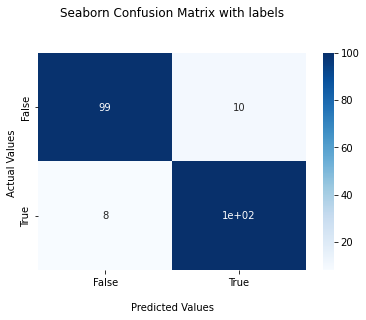

In [61]:
import seaborn as sns

ax = sns.heatmap(cm, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()





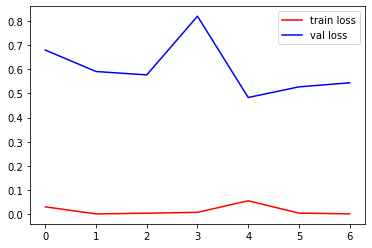

In [62]:
# loss
plt.figure(figsize=(6,4))
plt.plot(r.history['loss'], label='train loss', color="red")
plt.plot(r.history['val_loss'], label='val loss', color="blue")
plt.legend()
plt.show()
#plt.savefig('LossVal_loss')

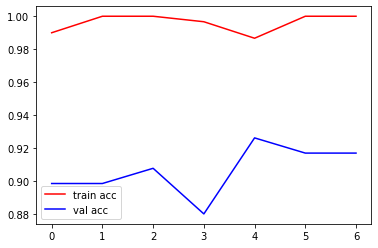

In [63]:
# accuracies
plt.figure(figsize=(6,4))
plt.plot(r.history['accuracy'], label='train acc', color="red")
plt.plot(r.history['val_accuracy'], label='val acc', color="blue")
plt.legend()
#plt.bar(r.history['accuracy'],height = 1.0)

plt.show()
#plt.savefig('AccVal_acc')



In [ ]:
#Applied Example

In [42]:
from PIL import Image
from numpy import asarray
# load the image
image = Image.open('D:\JungSenWork\AppliedExample\Sensitive\img_22907.jpg')
# convert image to numpy array
data = asarray(image)
print(type(data))
# summarize shape
print(data.shape)

# create Pillow image
image2 = Image.fromarray(data)
print(type(image2))

# summarize image details
print(image2.mode)
print(image2.size)

<class 'numpy.ndarray'>
(256, 256, 3)
<class 'PIL.Image.Image'>
RGB
(256, 256)


In [46]:
i=1
for d in data:
    print(d)
    print("=======================Row" + str(i))
    i=i+1

[[122 123 169]
 [131 132 178]
 [141 144 189]
 [148 151 196]
 [150 154 199]
 [151 158 202]
 [156 163 207]
 [159 168 211]
 [154 163 206]
 [151 160 203]
 [155 159 204]
 [157 161 206]
 [156 159 204]
 [149 152 197]
 [147 148 194]
 [152 146 190]
 [159 144 183]
 [161 144 180]
 [158 142 181]
 [149 138 178]
 [143 136 177]
 [139 138 178]
 [141 144 187]
 [142 149 191]
 [140 147 193]
 [140 148 194]
 [144 148 195]
 [143 147 194]
 [144 145 193]
 [146 144 193]
 [149 146 193]
 [154 146 193]
 [157 148 191]
 [158 146 186]
 [167 149 187]
 [172 151 184]
 [191 166 195]
 [241 216 237]
 [255 246 255]
 [247 228 232]
 [222 208 205]
 [204 194 184]
 [221 214 196]
 [226 218 197]
 [196 184 162]
 [195 179 154]
 [195 173 150]
 [160 129 108]
 [138  95  76]
 [143  94  77]
 [153 104  87]
 [155 106  89]
 [144  95  81]
 [143  94  80]
 [150 100  91]
 [148  98  89]
 [146  95  91]
 [149  98  95]
 [157 106 105]
 [163 111 113]
 [163 111 115]
 [161 109 113]
 [166 113 119]
 [176 121 127]
 [183 124 130]
 [179 123 126]
 [166 116 

[[156 151 183]
 [150 141 172]
 [142 129 157]
 [137 119 143]
 [137 115 136]
 [140 116 138]
 [142 120 143]
 [142 122 149]
 [144 129 162]
 [142 132 169]
 [142 135 176]
 [145 139 183]
 [147 141 185]
 [150 143 187]
 [154 143 186]
 [152 144 185]
 [147 144 187]
 [146 148 189]
 [150 152 193]
 [154 156 197]
 [156 158 197]
 [157 159 198]
 [156 158 197]
 [155 157 196]
 [156 158 196]
 [160 162 200]
 [164 166 204]
 [166 168 206]
 [167 170 205]
 [168 171 206]
 [169 172 207]
 [173 173 209]
 [176 172 209]
 [182 176 212]
 [175 171 206]
 [170 166 199]
 [178 175 204]
 [182 178 205]
 [182 177 200]
 [189 180 201]
 [192 179 197]
 [224 205 224]
 [235 211 227]
 [196 165 181]
 [181 145 159]
 [196 155 169]
 [192 148 161]
 [195 149 159]
 [193 147 150]
 [198 150 150]
 [201 151 152]
 [202 151 148]
 [204 151 145]
 [204 150 140]
 [207 150 139]
 [209 151 137]
 [212 153 137]
 [214 153 135]
 [216 155 137]
 [215 157 137]
 [217 159 139]
 [219 161 141]
 [219 162 142]
 [221 163 143]
 [225 164 146]
 [225 164 146]
 [223 166 

[[137 124 152]
 [126 116 143]
 [150 141 168]
 [197 191 219]
 [209 204 236]
 [175 174 206]
 [151 151 185]
 [152 155 190]
 [151 153 191]
 [152 154 192]
 [155 153 190]
 [155 151 188]
 [153 147 183]
 [152 144 181]
 [155 143 181]
 [158 143 176]
 [149 129 156]
 [149 125 149]
 [146 122 146]
 [147 122 144]
 [148 123 145]
 [150 125 146]
 [152 124 146]
 [152 125 144]
 [153 124 142]
 [153 125 140]
 [156 125 140]
 [157 126 141]
 [159 127 140]
 [160 128 141]
 [160 128 141]
 [162 129 140]
 [166 130 140]
 [166 133 142]
 [163 133 141]
 [155 132 138]
 [200 185 188]
 [255 249 250]
 [255 255 253]
 [252 255 253]
 [251 255 253]
 [249 255 253]
 [249 255 253]
 [251 255 251]
 [254 255 253]
 [255 255 251]
 [255 254 253]
 [255 255 250]
 [242 248 234]
 [252 255 236]
 [250 250 214]
 [245 242 197]
 [253 253 203]
 [249 255 202]
 [237 251 198]
 [240 254 201]
 [254 255 205]
 [249 243 183]
 [231 210 145]
 [223 193 131]
 [232 200 149]
 [239 213 176]
 [243 231 209]
 [255 251 240]
 [255 255 248]
 [255 255 250]
 [255 255 

 [159 121 134]]
=======================Row156
[[135 116 144]
 [143 127 156]
 [158 143 174]
 [169 158 192]
 [173 165 202]
 [170 165 205]
 [159 158 200]
 [150 153 196]
 [151 154 199]
 [150 153 196]
 [150 151 195]
 [149 151 192]
 [151 151 189]
 [154 152 189]
 [159 153 189]
 [159 155 190]
 [153 151 190]
 [154 153 193]
 [157 155 194]
 [160 158 197]
 [162 160 199]
 [164 162 201]
 [166 162 199]
 [167 163 200]
 [166 162 199]
 [167 163 200]
 [168 162 198]
 [169 163 199]
 [168 162 198]
 [168 162 198]
 [167 161 195]
 [167 162 194]
 [165 162 193]
 [167 160 193]
 [174 158 195]
 [175 157 199]
 [173 156 201]
 [167 156 199]
 [159 157 196]
 [160 156 189]
 [171 157 183]
 [183 154 172]
 [195 145 154]
 [204 145 141]
 [213 151 130]
 [251 195 158]
 [231 190 138]
 [221 191 131]
 [230 205 148]
 [255 236 179]
 [247 216 159]
 [215 180 122]
 [223 184 125]
 [228 192 134]
 [227 196 142]
 [240 216 168]
 [255 250 211]
 [255 255 226]
 [255 255 236]
 [252 255 241]
 [252 255 246]
 [255 255 250]
 [255 255 251]
 [255 255

 [122  91  97]]
=======================Row205
[[159 110 116]
 [156 109 115]
 [153 111 115]
 [154 113 117]
 [156 117 118]
 [158 118 119]
 [156 114 116]
 [155 109 111]
 [155 103 107]
 [162 107 110]
 [168 112 115]
 [165 110 113]
 [158 108 107]
 [153 108 105]
 [155 114 110]
 [159 121 120]
 [154 115 120]
 [164 131 150]
 [165 143 181]
 [169 148 187]
 [174 146 168]
 [159 126 133]
 [146 108 107]
 [142 110 113]
 [158 135 161]
 [168 151 183]
 [177 154 180]
 [159 131 145]
 [130  94  96]
 [119  84  90]
 [140 116 142]
 [176 152 186]
 [179 146 177]
 [178 144 161]
 [175 145 135]
 [180 154 141]
 [185 158 163]
 [175 151 167]
 [176 152 178]
 [193 172 187]
 [233 219 206]
 [253 242 220]
 [192 180 166]
 [181 167 167]
 [183 166 184]
 [184 167 183]
 [213 200 191]
 [214 202 178]
 [176 164 138]
 [169 155 144]
 [175 154 171]
 [178 159 181]
 [218 199 205]
 [209 195 186]
 [197 182 163]
 [177 164 148]
 [171 151 160]
 [171 153 167]
 [214 195 199]
 [251 236 229]
 [255 246 225]
 [220 206 195]
 [174 153 172]
 [176 156

 [124  88  92]]
=======================Row250
[[135 102 119]
 [135 102 119]
 [136 103 120]
 [136 103 120]
 [136 103 120]
 [137 104 121]
 [138 104 121]
 [138 104 121]
 [136 102 119]
 [139 105 122]
 [143 106 124]
 [144 107 125]
 [142 105 123]
 [141 104 122]
 [142 103 122]
 [142 103 122]
 [146 107 125]
 [145 107 122]
 [144 106 121]
 [144 106 121]
 [144 106 121]
 [145 107 120]
 [148 107 121]
 [148 107 121]
 [150 108 122]
 [152 110 122]
 [154 112 124]
 [152 110 120]
 [149 106 116]
 [148 105 115]
 [151 108 118]
 [154 111 121]
 [156 110 121]
 [156 110 120]
 [156 110 120]
 [155 110 117]
 [154 107 115]
 [151 104 110]
 [148 102 105]
 [146 100 103]
 [151 102 105]
 [155 107 107]
 [160 110 111]
 [161 111 110]
 [159 109 108]
 [155 106 102]
 [152 102 101]
 [152 101  98]
 [159 100 102]
 [160 100 100]
 [161 101 101]
 [161 101 101]
 [161 101 101]
 [161 101 100]
 [160 101  97]
 [160 101  97]
 [160 101  95]
 [161 102  96]
 [162 103  95]
 [166 107  99]
 [169 111 100]
 [169 111 100]
 [167 109  98]
 [164 106

In [47]:
i=1
for d in data:
    print(d/255)
    print("=======================Row" + str(i))
    i=i+1

[[0.47843137 0.48235294 0.6627451 ]
 [0.51372549 0.51764706 0.69803922]
 [0.55294118 0.56470588 0.74117647]
 [0.58039216 0.59215686 0.76862745]
 [0.58823529 0.60392157 0.78039216]
 [0.59215686 0.61960784 0.79215686]
 [0.61176471 0.63921569 0.81176471]
 [0.62352941 0.65882353 0.82745098]
 [0.60392157 0.63921569 0.80784314]
 [0.59215686 0.62745098 0.79607843]
 [0.60784314 0.62352941 0.8       ]
 [0.61568627 0.63137255 0.80784314]
 [0.61176471 0.62352941 0.8       ]
 [0.58431373 0.59607843 0.77254902]
 [0.57647059 0.58039216 0.76078431]
 [0.59607843 0.57254902 0.74509804]
 [0.62352941 0.56470588 0.71764706]
 [0.63137255 0.56470588 0.70588235]
 [0.61960784 0.55686275 0.70980392]
 [0.58431373 0.54117647 0.69803922]
 [0.56078431 0.53333333 0.69411765]
 [0.54509804 0.54117647 0.69803922]
 [0.55294118 0.56470588 0.73333333]
 [0.55686275 0.58431373 0.74901961]
 [0.54901961 0.57647059 0.75686275]
 [0.54901961 0.58039216 0.76078431]
 [0.56470588 0.58039216 0.76470588]
 [0.56078431 0.57647059 0.76

[[0.54509804 0.49411765 0.61176471]
 [0.50196078 0.45882353 0.58431373]
 [0.63529412 0.61568627 0.74117647]
 [0.70980392 0.71372549 0.83529412]
 [0.66666667 0.69019608 0.81568627]
 [0.65882353 0.69411765 0.82352941]
 [0.63921569 0.67058824 0.81176471]
 [0.65098039 0.67058824 0.81960784]
 [0.61960784 0.61568627 0.78039216]
 [0.58039216 0.56862745 0.7372549 ]
 [0.55686275 0.53333333 0.70588235]
 [0.55294118 0.52941176 0.70196078]
 [0.55294118 0.54509804 0.70196078]
 [0.56078431 0.55686275 0.71372549]
 [0.57647059 0.59215686 0.74117647]
 [0.60392157 0.62352941 0.78039216]
 [0.59215686 0.61960784 0.79215686]
 [0.57647059 0.60392157 0.78431373]
 [0.56862745 0.57254902 0.74509804]
 [0.57254902 0.55294118 0.71372549]
 [0.56862745 0.5372549  0.69019608]
 [0.57254902 0.5254902  0.68235294]
 [0.56862745 0.51764706 0.68627451]
 [0.55686275 0.52156863 0.69019608]
 [0.59215686 0.56078431 0.74509804]
 [0.57254902 0.56078431 0.74509804]
 [0.58431373 0.57647059 0.76078431]
 [0.61568627 0.61176471 0.78

 [0.91372549 0.77647059 0.61960784]]
=======================Row40
[[0.61568627 0.62745098 0.74901961]
 [0.70196078 0.71372549 0.83529412]
 [0.69411765 0.70980392 0.84705882]
 [0.62745098 0.64313725 0.78823529]
 [0.60784314 0.61568627 0.76862745]
 [0.59607843 0.59607843 0.74509804]
 [0.56470588 0.54117647 0.68235294]
 [0.54901961 0.50588235 0.63921569]
 [0.54509804 0.47843137 0.61176471]
 [0.56862745 0.48627451 0.60784314]
 [0.58823529 0.50588235 0.62745098]
 [0.61568627 0.54117647 0.66666667]
 [0.63529412 0.58039216 0.71764706]
 [0.63921569 0.60784314 0.76078431]
 [0.63137255 0.62745098 0.79215686]
 [0.63921569 0.62745098 0.79607843]
 [0.64313725 0.60392157 0.74901961]
 [0.63529412 0.58039216 0.71764706]
 [0.62352941 0.55686275 0.69019608]
 [0.63921569 0.56470588 0.69019608]
 [0.68627451 0.58823529 0.71372549]
 [0.72941176 0.62745098 0.74117647]
 [0.76862745 0.65098039 0.76078431]
 [0.78823529 0.65882353 0.76470588]
 [0.76470588 0.63921569 0.73333333]
 [0.77647059 0.65098039 0.74117647

[[0.62352941 0.60784314 0.7372549 ]
 [0.59215686 0.57254902 0.69803922]
 [0.55686275 0.51372549 0.63137255]
 [0.53333333 0.47058824 0.57254902]
 [0.5372549  0.45098039 0.54117647]
 [0.54509804 0.45098039 0.5372549 ]
 [0.55294118 0.46666667 0.55686275]
 [0.55294118 0.4745098  0.58039216]
 [0.56078431 0.50196078 0.62352941]
 [0.55686275 0.50980392 0.65098039]
 [0.56078431 0.52941176 0.69019608]
 [0.56862745 0.54117647 0.70588235]
 [0.58039216 0.55294118 0.71764706]
 [0.58823529 0.56078431 0.7254902 ]
 [0.60392157 0.56078431 0.7254902 ]
 [0.59607843 0.56470588 0.7254902 ]
 [0.57647059 0.56470588 0.73333333]
 [0.58431373 0.58039216 0.74509804]
 [0.6        0.59607843 0.76078431]
 [0.61568627 0.61176471 0.77647059]
 [0.62745098 0.62352941 0.78039216]
 [0.62745098 0.62352941 0.78039216]
 [0.61568627 0.61176471 0.76862745]
 [0.60784314 0.60392157 0.76078431]
 [0.61960784 0.61960784 0.76862745]
 [0.63137255 0.63137255 0.78039216]
 [0.64705882 0.64705882 0.79607843]
 [0.65490196 0.65490196 0.80

 [1.         0.96862745 0.78823529]]
=======================Row72
[[0.53333333 0.40784314 0.41960784]
 [0.54509804 0.42352941 0.44313725]
 [0.55686275 0.43921569 0.47058824]
 [0.54901961 0.43921569 0.49411765]
 [0.5372549  0.44705882 0.51764706]
 [0.54117647 0.4627451  0.56078431]
 [0.56470588 0.50196078 0.61568627]
 [0.58823529 0.53333333 0.67058824]
 [0.59215686 0.54901961 0.70588235]
 [0.58431373 0.55686275 0.71764706]
 [0.57254902 0.55294118 0.71372549]
 [0.55294118 0.54117647 0.70980392]
 [0.54117647 0.52941176 0.69803922]
 [0.55686275 0.55294118 0.71764706]
 [0.6        0.59607843 0.76078431]
 [0.63529412 0.63529412 0.77647059]
 [0.72156863 0.7372549  0.85098039]
 [0.75294118 0.77647059 0.8627451 ]
 [0.77647059 0.8        0.89411765]
 [0.76078431 0.78431373 0.87843137]
 [0.73333333 0.76470588 0.85490196]
 [0.72941176 0.76078431 0.85098039]
 [0.73333333 0.76078431 0.8627451 ]
 [0.7372549  0.76470588 0.86666667]
 [0.70588235 0.7254902  0.83921569]
 [0.70588235 0.72156863 0.83529412

[[0.52156863 0.40392157 0.37254902]
 [0.56078431 0.43921569 0.42745098]
 [0.54509804 0.43137255 0.45098039]
 [0.51764706 0.41568627 0.46666667]
 [0.5372549  0.44313725 0.5372549 ]
 [0.5372549  0.4627451  0.57254902]
 [0.5254902  0.46666667 0.58823529]
 [0.5372549  0.49411765 0.61960784]
 [0.58039216 0.55686275 0.65882353]
 [0.65882353 0.65098039 0.7372549 ]
 [0.75294118 0.76470588 0.83921569]
 [0.83137255 0.85490196 0.91764706]
 [0.89411765 0.92156863 0.98431373]
 [0.90588235 0.93333333 0.99607843]
 [0.81960784 0.85490196 0.92156863]
 [0.72156863 0.74509804 0.83137255]
 [0.67058824 0.69019608 0.80392157]
 [0.65098039 0.6627451  0.79215686]
 [0.61568627 0.62745098 0.75686275]
 [0.58823529 0.58823529 0.72156863]
 [0.56862745 0.56078431 0.70588235]
 [0.56862745 0.55294118 0.69803922]
 [0.57254902 0.54901961 0.69803922]
 [0.57254902 0.54901961 0.69803922]
 [0.59607843 0.55294118 0.70980392]
 [0.6        0.56078431 0.70588235]
 [0.60392157 0.55686275 0.69803922]
 [0.61176471 0.55686275 0.69

[[0.58039216 0.4627451  0.55686275]
 [0.57254902 0.4627451  0.55294118]
 [0.54509804 0.45882353 0.54901961]
 [0.54509804 0.4745098  0.56862745]
 [0.6        0.56078431 0.65882353]
 [0.70980392 0.69411765 0.79215686]
 [0.79215686 0.79607843 0.90588235]
 [0.82352941 0.83921569 0.95294118]
 [0.74117647 0.76078431 0.87843137]
 [0.64705882 0.66666667 0.78431373]
 [0.58431373 0.59607843 0.7254902 ]
 [0.59607843 0.59607843 0.72941176]
 [0.61568627 0.6        0.72941176]
 [0.59607843 0.57254902 0.70588235]
 [0.58823529 0.56078431 0.69411765]
 [0.61568627 0.56862745 0.70980392]
 [0.61960784 0.56470588 0.70196078]
 [0.61176471 0.54901961 0.69019608]
 [0.59215686 0.52941176 0.67058824]
 [0.57647059 0.50980392 0.64313725]
 [0.57254902 0.49803922 0.61568627]
 [0.57254902 0.49411765 0.60392157]
 [0.57254902 0.49411765 0.59215686]
 [0.58039216 0.49411765 0.58431373]
 [0.59215686 0.49411765 0.57647059]
 [0.58823529 0.49019608 0.56470588]
 [0.59607843 0.49019608 0.54901961]
 [0.60392157 0.49411765 0.54

 [0.58039216 0.46666667 0.54509804]]
=======================Row120
[[0.54509804 0.51372549 0.65882353]
 [0.56078431 0.52941176 0.6745098 ]
 [0.54901961 0.5254902  0.66666667]
 [0.52941176 0.50588235 0.64705882]
 [0.53333333 0.50980392 0.65098039]
 [0.56470588 0.54117647 0.68235294]
 [0.58431373 0.55294118 0.69803922]
 [0.57647059 0.54901961 0.68235294]
 [0.58039216 0.54117647 0.67843137]
 [0.58431373 0.54117647 0.66666667]
 [0.58431373 0.53333333 0.65098039]
 [0.57647059 0.51372549 0.61960784]
 [0.56470588 0.49411765 0.59607843]
 [0.54901961 0.4745098  0.56078431]
 [0.54509804 0.45882353 0.54901961]
 [0.54509804 0.45098039 0.5372549 ]
 [0.57647059 0.46666667 0.55294118]
 [0.58039216 0.47058824 0.55686275]
 [0.58823529 0.47843137 0.56470588]
 [0.59607843 0.49019608 0.56470588]
 [0.6        0.49411765 0.56862745]
 [0.6        0.49411765 0.56862745]
 [0.59607843 0.49019608 0.56470588]
 [0.59607843 0.49019608 0.55686275]
 [0.6        0.49411765 0.56078431]
 [0.6        0.49411765 0.5529411

[[0.58823529 0.59607843 0.74901961]
 [0.59215686 0.6        0.75294118]
 [0.59607843 0.60392157 0.75686275]
 [0.6        0.60784314 0.76078431]
 [0.60392157 0.6        0.75686275]
 [0.6        0.59607843 0.75294118]
 [0.59607843 0.58823529 0.74509804]
 [0.59215686 0.58431373 0.74117647]
 [0.59215686 0.58431373 0.7372549 ]
 [0.60392157 0.58431373 0.74117647]
 [0.61176471 0.59215686 0.74901961]
 [0.61568627 0.59607843 0.75294118]
 [0.61568627 0.58823529 0.74901961]
 [0.60392157 0.57647059 0.7372549 ]
 [0.59215686 0.56470588 0.7254902 ]
 [0.58431373 0.55686275 0.71764706]
 [0.59607843 0.57647059 0.7372549 ]
 [0.58039216 0.57254902 0.72941176]
 [0.58823529 0.56862745 0.72941176]
 [0.59215686 0.57254902 0.73333333]
 [0.60392157 0.57647059 0.7372549 ]
 [0.60784314 0.58039216 0.74117647]
 [0.61568627 0.57254902 0.72941176]
 [0.61176471 0.56862745 0.7254902 ]
 [0.60392157 0.55686275 0.71372549]
 [0.60392157 0.54509804 0.69803922]
 [0.60392157 0.54117647 0.69411765]
 [0.61176471 0.54117647 0.69

 [0.62352941 0.4745098  0.5254902 ]]
=======================Row156
[[0.52941176 0.45490196 0.56470588]
 [0.56078431 0.49803922 0.61176471]
 [0.61960784 0.56078431 0.68235294]
 [0.6627451  0.61960784 0.75294118]
 [0.67843137 0.64705882 0.79215686]
 [0.66666667 0.64705882 0.80392157]
 [0.62352941 0.61960784 0.78431373]
 [0.58823529 0.6        0.76862745]
 [0.59215686 0.60392157 0.78039216]
 [0.58823529 0.6        0.76862745]
 [0.58823529 0.59215686 0.76470588]
 [0.58431373 0.59215686 0.75294118]
 [0.59215686 0.59215686 0.74117647]
 [0.60392157 0.59607843 0.74117647]
 [0.62352941 0.6        0.74117647]
 [0.62352941 0.60784314 0.74509804]
 [0.6        0.59215686 0.74509804]
 [0.60392157 0.6        0.75686275]
 [0.61568627 0.60784314 0.76078431]
 [0.62745098 0.61960784 0.77254902]
 [0.63529412 0.62745098 0.78039216]
 [0.64313725 0.63529412 0.78823529]
 [0.65098039 0.63529412 0.78039216]
 [0.65490196 0.63921569 0.78431373]
 [0.65098039 0.63529412 0.78039216]
 [0.65490196 0.63921569 0.7843137

 [0.60784314 0.45098039 0.48627451]]
=======================Row171
[[0.64705882 0.55294118 0.65490196]
 [0.64705882 0.55294118 0.64705882]
 [0.65098039 0.54901961 0.64705882]
 [0.64705882 0.54901961 0.63529412]
 [0.65882353 0.54117647 0.63529412]
 [0.65882353 0.54509804 0.63137255]
 [0.6627451  0.5372549  0.62745098]
 [0.6627451  0.5372549  0.61960784]
 [0.65098039 0.52941176 0.6       ]
 [0.63921569 0.53333333 0.6       ]
 [0.65098039 0.55686275 0.61176471]
 [0.58823529 0.50980392 0.55294118]
 [0.43921569 0.37647059 0.41568627]
 [0.34509804 0.30196078 0.3254902 ]
 [0.3372549  0.30196078 0.32156863]
 [0.34117647 0.30196078 0.30588235]
 [0.43137255 0.35294118 0.34901961]
 [0.45882353 0.36470588 0.35686275]
 [0.41568627 0.32156863 0.32156863]
 [0.39607843 0.29803922 0.30980392]
 [0.50196078 0.39607843 0.41568627]
 [0.61176471 0.50588235 0.53333333]
 [0.65882353 0.54117647 0.58039216]
 [0.66666667 0.54901961 0.58823529]
 [0.67058824 0.54509804 0.59607843]
 [0.6745098  0.54117647 0.5960784

 [0.59607843 0.43529412 0.45882353]]
=======================Row187
[[0.71372549 0.53333333 0.54509804]
 [0.70980392 0.53333333 0.54509804]
 [0.70196078 0.5372549  0.54509804]
 [0.69803922 0.54509804 0.54901961]
 [0.69803922 0.54509804 0.55686275]
 [0.69019608 0.54901961 0.55686275]
 [0.70196078 0.54117647 0.55686275]
 [0.70588235 0.54509804 0.56078431]
 [0.70588235 0.52941176 0.55686275]
 [0.71372549 0.54509804 0.57254902]
 [0.72156863 0.56078431 0.59215686]
 [0.65882353 0.52156863 0.54509804]
 [0.43137255 0.32941176 0.34117647]
 [0.30196078 0.23137255 0.23137255]
 [0.32941176 0.29019608 0.28235294]
 [0.27058824 0.23921569 0.22745098]
 [0.29803922 0.24313725 0.23921569]
 [0.38039216 0.31372549 0.34509804]
 [0.56862745 0.47843137 0.59215686]
 [0.69411765 0.6        0.70196078]
 [0.68627451 0.6        0.60784314]
 [0.44705882 0.36470588 0.29803922]
 [0.43137255 0.3372549  0.23529412]
 [0.58431373 0.4745098  0.41960784]
 [0.6627451  0.5254902  0.60392157]
 [0.70980392 0.56470588 0.6980392

[[0.61176471 0.42745098 0.45098039]
 [0.58823529 0.41176471 0.43137255]
 [0.56470588 0.4        0.41568627]
 [0.56078431 0.4        0.41568627]
 [0.57254902 0.41960784 0.42352941]
 [0.6        0.44313725 0.44705882]
 [0.61568627 0.45098039 0.45882353]
 [0.63137255 0.45098039 0.4627451 ]
 [0.64313725 0.43921569 0.45490196]
 [0.64705882 0.43137255 0.45098039]
 [0.64705882 0.43137255 0.45098039]
 [0.64313725 0.43921569 0.44705882]
 [0.63921569 0.45098039 0.45098039]
 [0.60784314 0.44705882 0.43921569]
 [0.56862745 0.43137255 0.41568627]
 [0.53333333 0.40784314 0.41960784]
 [0.54901961 0.41960784 0.49411765]
 [0.61176471 0.50980392 0.62352941]
 [0.63529412 0.58039216 0.70980392]
 [0.64313725 0.6        0.7254902 ]
 [0.67058824 0.58039216 0.69019608]
 [0.61176471 0.50196078 0.58823529]
 [0.54509804 0.41568627 0.48235294]
 [0.51372549 0.4        0.47058824]
 [0.61568627 0.55294118 0.65490196]
 [0.63529412 0.59607843 0.70196078]
 [0.65098039 0.58823529 0.69019608]
 [0.61176471 0.51764706 0.61

[[0.57647059 0.42352941 0.43529412]
 [0.54901961 0.39607843 0.40784314]
 [0.54901961 0.39215686 0.39607843]
 [0.56862745 0.40392157 0.40784314]
 [0.56470588 0.39215686 0.38823529]
 [0.54901961 0.37254902 0.35294118]
 [0.57647059 0.39215686 0.36862745]
 [0.61960784 0.42745098 0.4       ]
 [0.62745098 0.43529412 0.40784314]
 [0.59607843 0.40392157 0.37647059]
 [0.54901961 0.36078431 0.32156863]
 [0.60392157 0.41568627 0.37647059]
 [0.61960784 0.43529412 0.40392157]
 [0.6        0.41568627 0.38431373]
 [0.61568627 0.43137255 0.4       ]
 [0.54117647 0.38431373 0.35294118]
 [0.56078431 0.44313725 0.40392157]
 [0.60784314 0.51764706 0.54117647]
 [0.65098039 0.59607843 0.7254902 ]
 [0.65490196 0.60784314 0.74901961]
 [0.68627451 0.61568627 0.67058824]
 [0.5254902  0.43137255 0.41568627]
 [0.59215686 0.48235294 0.42745098]
 [0.62352941 0.5254902  0.49803922]
 [0.63921569 0.58039216 0.67058824]
 [0.64705882 0.60392157 0.72941176]
 [0.65490196 0.59607843 0.67058824]
 [0.62745098 0.54901961 0.55

[[0.21960784 0.17254902 0.21960784]
 [0.22745098 0.18823529 0.23137255]
 [0.24313725 0.19607843 0.24313725]
 [0.24313725 0.19607843 0.24313725]
 [0.24313725 0.19607843 0.24313725]
 [0.24313725 0.19607843 0.24313725]
 [0.25098039 0.19607843 0.24705882]
 [0.25098039 0.19607843 0.24705882]
 [0.2627451  0.2        0.25098039]
 [0.25098039 0.18823529 0.23921569]
 [0.23921569 0.16862745 0.22352941]
 [0.23137255 0.16078431 0.21568627]
 [0.22745098 0.15686275 0.21176471]
 [0.22352941 0.15294118 0.20784314]
 [0.22745098 0.14509804 0.20392157]
 [0.21176471 0.14117647 0.18823529]
 [0.15294118 0.10980392 0.14117647]
 [0.39607843 0.35294118 0.40784314]
 [0.65098039 0.6        0.70980392]
 [0.66666667 0.61568627 0.73333333]
 [0.5372549  0.49019608 0.56862745]
 [0.23921569 0.2        0.24313725]
 [0.17254902 0.13333333 0.16470588]
 [0.28627451 0.24705882 0.29019608]
 [0.65882353 0.60784314 0.71764706]
 [0.67058824 0.61568627 0.74509804]
 [0.58431373 0.53333333 0.64313725]
 [0.30196078 0.25490196 0.33

[[0.53333333 0.40392157 0.47058824]
 [0.53333333 0.41176471 0.4745098 ]
 [0.5372549  0.40784314 0.4745098 ]
 [0.53333333 0.40392157 0.47058824]
 [0.53333333 0.40392157 0.47058824]
 [0.52941176 0.4        0.46666667]
 [0.52941176 0.39607843 0.4627451 ]
 [0.52941176 0.39607843 0.4627451 ]
 [0.54117647 0.40784314 0.4745098 ]
 [0.54901961 0.41568627 0.48235294]
 [0.56078431 0.41568627 0.48627451]
 [0.56078431 0.41568627 0.48627451]
 [0.55686275 0.41176471 0.48235294]
 [0.55294118 0.40784314 0.47843137]
 [0.56078431 0.40784314 0.48235294]
 [0.56470588 0.41176471 0.48235294]
 [0.57254902 0.42352941 0.48235294]
 [0.57647059 0.42745098 0.48627451]
 [0.57647059 0.42745098 0.48627451]
 [0.58039216 0.43137255 0.48235294]
 [0.58039216 0.43137255 0.48235294]
 [0.58039216 0.43137255 0.48235294]
 [0.58823529 0.42745098 0.48235294]
 [0.58823529 0.43137255 0.4745098 ]
 [0.60784314 0.44313725 0.49019608]
 [0.61176471 0.44705882 0.49411765]
 [0.61176471 0.44705882 0.48627451]
 [0.60392157 0.43921569 0.47

In [40]:
test_datagen = ImageDataGenerator(rescale = 1./255)  
testset = test_datagen.flow_from_directory('D:\JungSenWork\AppliedExample',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 1 images belonging to 2 classes.


In [41]:
for t in testset:
    print(t)

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

         [0.48627454, 0.3254902 , 0.34117648]]]], dtype=float32), array([[0., 1.]], dtype=float32))
(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

     

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

KeyboardInterrupt: 